# Tabular claasification: Alibi

In this notebook, we examine the explanation methods in Alibi applied to three models: Logistic regression, Random Forest, and MLP.

It is not finished because each of the methods uses a different interface, very hard to write codes.

In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [39]:
import numpy as np
import pandas as pd
import tensorflow as tf
tf.compat.v1.disable_v2_behavior()

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler


Instructions for updating:
non-resource variables are not supported in the long term


Load data, define veriale names, split into train/valid/test

In [3]:
data = pd.read_csv("/home/kxlu/Documents/xai_compare/data/fraud/creditcard.csv")
target = 'Class'
predictors = ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',\
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',\
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28',\
       'Amount']

# split data into train, validation, and test
train_df, test_df = train_test_split(data, train_size=0.80, random_state=42,shuffle=True)

X_train = train_df[predictors]
X_test = test_df[predictors]
train_labels = train_df[target]
test_labels = test_df[target]
# normalize data
X_train=(X_train-X_train.mean())/X_train.std()
X_test=(X_test-X_test.mean())/X_test.std()
# X_train.index = train_df.index
# X_test.index = test_df.index

Build logistic regression

In [4]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(fit_intercept=False)
lr.fit(X_train, train_labels)

LogisticRegression(fit_intercept=False)

Build random forest

In [5]:
clf = RandomForestClassifier(n_jobs=5, 
                             random_state=42,
                             criterion='gini',
                             n_estimators=100,
                             verbose=False)
clf.fit(X_train, train_labels)

RandomForestClassifier(n_jobs=5, random_state=42, verbose=False)

Build MLP using TF

In [7]:
from tensorflow.keras import regularizers
model = tf.keras.Sequential(
    [
        # Adjusted number of neurons
        tf.keras.layers.Dense(128, activation="relu", input_shape=(X_train.shape[-1],),
                              kernel_regularizer=regularizers.l2(0.001)),  # L2 regularization
        tf.keras.layers.Dropout(0.2),  # Adjusted dropout rate
        tf.keras.layers.Dense(64, activation="relu",
                              kernel_regularizer=regularizers.l2(0.001)),  # L2 regularization
        tf.keras.layers.Dropout(0.2),  # Adjusted dropout rate
        tf.keras.layers.Dense(1, activation="sigmoid"),
    ]
)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               3968      
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 12289 (48.00 KB)
Trainable params: 12289 (48.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


2024-06-23 16:09:36.444667: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2211] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [8]:
metrics = [
    tf.keras.metrics.FalseNegatives(name="fn"),
    tf.keras.metrics.FalsePositives(name="fp"),
    tf.keras.metrics.TrueNegatives(name="tn"),
    tf.keras.metrics.TruePositives(name="tp"),
    tf.keras.metrics.Precision(name="precision"),
    tf.keras.metrics.Recall(name="recall"),
]

# compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics = metrics)

# calculate class weights
neg, pos = np.bincount(train_labels.astype("int64"))
total = neg + pos
class_weight = {0: 1, 1: 5}

# train the model
history = model.fit(X_train, train_labels,epochs=5, class_weight=class_weight)

Epoch 1/5
7121/7121 [==============================] - 33s 5ms/step - loss: 0.1292 - fn: 140.0000 - fp: 437.0000 - tn: 227014.0000 - tp: 254.0000 - precision: 0.3676 - recall: 0.6447
Epoch 2/5
7121/7121 [==============================] - 32s 4ms/step - loss: 0.0550 - fn: 87.0000 - fp: 68.0000 - tn: 227383.0000 - tp: 307.0000 - precision: 0.8187 - recall: 0.7792
Epoch 3/5
7121/7121 [==============================] - 32s 5ms/step - loss: 0.0318 - fn: 79.0000 - fp: 68.0000 - tn: 227383.0000 - tp: 315.0000 - precision: 0.8225 - recall: 0.7995
Epoch 4/5
7121/7121 [==============================] - 32s 5ms/step - loss: 0.0218 - fn: 79.0000 - fp: 73.0000 - tn: 227378.0000 - tp: 315.0000 - precision: 0.8119 - recall: 0.7995
Epoch 5/5
7121/7121 [==============================] - 33s 5ms/step - loss: 0.0171 - fn: 74.0000 - fp: 68.0000 - tn: 227383.0000 - tp: 320.0000 - precision: 0.8247 - recall: 0.8122


### Logistic regression

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names


array([[<Axes: xlabel='V1', ylabel='ALE'>,
        <Axes: xlabel='V2', ylabel='ALE'>]], dtype=object)

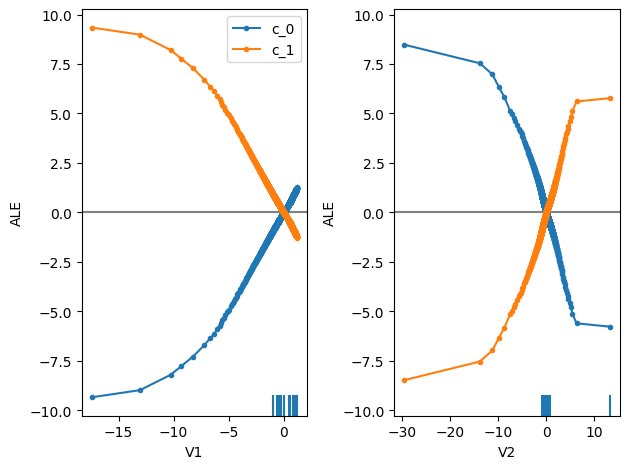

In [30]:
from alibi.explainers import ALE
predict_fn = lambda x: lr.predict_proba(x)
ale = ALE(predict_fn, feature_names=predictors)
exp = ale.explain(X_test.values,features=[1,2])
from alibi.explainers import plot_ale
plot_ale(exp)

In [33]:
from alibi.explainers import AnchorTabular
explainer = AnchorTabular(predict_fn, feature_names=predictors)
explainer.fit(X_test.values, disc_perc=(25, 50, 75))
explanation = explainer.explain(X_test.values[0], threshold=0.95)
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('Coverage: %.2f' % explanation.coverage)

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names


Anchor: V3 <= -0.59 AND V7 <= -0.46
Precision: 0.95
Coverage: 0.05


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names


In [36]:
mode = 'PN'  # 'PN' (pertinent negative) or 'PP' (pertinent positive)
shape = (1,) + X_train.shape[1:]  # instance shape
kappa = .2  # minimum difference needed between the prediction probability for the perturbed instance on the
            # class predicted by the original instance and the max probability on the other classes
            # in order for the first loss term to be minimized
beta = .1  # weight of the L1 loss term
c_init = 10.  # initial weight c of the loss term encouraging to predict a different class (PN) or
              # the same class (PP) for the perturbed instance compared to the original instance to be explained
c_steps = 10  # nb of updates for c
max_iterations = 1000  # nb of iterations per value of c
feature_range = (X_train.values.min(axis=0).reshape(shape)-.1,  # feature range for the perturbed instance
                 X_train.values.max(axis=0).reshape(shape)+.1)  # can be either a float or array of shape (1xfeatures)
clip = (-1000.,1000.)  # gradient clipping
lr_init = 1e-2  # initial learning rate

In [45]:
from alibi.explainers import CEM
# initialize CEM explainer and explain instance
cem = CEM(predict_fn, mode, shape, kappa=kappa, beta=beta, feature_range=feature_range,
          max_iterations=max_iterations, c_init=c_init, c_steps=c_steps,
          learning_rate_init=lr_init, clip=clip)
cem.fit(X_train.values, no_info_type='median')  # we need to define what feature values contain the least
                                         # info wrt predictions
                                         # here we will naively assume that the feature-wise median
                                         # contains no info; domain knowledge helps!
explanation = cem.explain(X_test.values[:1], verbose=False)
print(f'Original instance: {explanation.X}')
print(f'Predicted class: {explanation.X_pred}')
print(f'Pertinent negative: {explanation.PN}')
print(f'Predicted class: {explanation.PN_pred}')

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not

Original instance: [[ -1.12438994  -8.4294138    5.26599046 -12.24722384   6.70921346
  -10.2134668   -2.15743422 -13.78622297   6.17601485  -7.70959869
  -12.86044736   5.20244309 -10.9598012    1.68032707  -9.81397158
    0.39204442 -11.35349332 -22.89256612 -10.01466454   3.81580005
   -1.99563155   1.60569184  -1.55728635  -3.84157701   1.10905607
   -2.72978095  -0.96294829  -4.91403858  -3.1444258    1.20221758]]
Predicted class: 1
Pertinent negative: None
Predicted class: None


In [46]:
mode = 'PP'
cem = CEM(predict_fn, mode, shape, kappa=kappa, beta=beta, feature_range=feature_range,
          max_iterations=max_iterations, c_init=c_init, c_steps=c_steps,
          learning_rate_init=lr_init, clip=clip)
cem.fit(X_train.values, no_info_type='median')  # we need to define what feature values contain the least
                                         # info wrt predictions
                                         # here we will naively assume that the feature-wise median
                                         # contains no info; domain knowledge helps!
explanation = cem.explain(X_test.values[:1], verbose=False)
print(f'Original instance: {explanation.X}')
print(f'Predicted class: {explanation.X_pred}')
print(f'Pertinent positives: {explanation.PN}')
print(f'Predicted class: {explanation.PN_pred}')

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not

Original instance: [[ -1.12438994  -8.4294138    5.26599046 -12.24722384   6.70921346
  -10.2134668   -2.15743422 -13.78622297   6.17601485  -7.70959869
  -12.86044736   5.20244309 -10.9598012    1.68032707  -9.81397158
    0.39204442 -11.35349332 -22.89256612 -10.01466454   3.81580005
   -1.99563155   1.60569184  -1.55728635  -3.84157701   1.10905607
   -2.72978095  -0.96294829  -4.91403858  -3.1444258    1.20221758]]
Predicted class: 1
Pertinent positives: None
Predicted class: None


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not

In [49]:
shape = (1,) + X_train.shape[1:]
target_proba = 1.0
tol = 0.01 # want counterfactuals with p(class)>0.99
target_class = 'other' # any class other than 7 will do
max_iter = 1000
lam_init = 1e-1
max_lam_steps = 10
learning_rate_init = 0.1
feature_range = (X_train.min(),X_train.max())

In [57]:
from alibi.explainers import Counterfactual
cf = Counterfactual(predict_fn, shape=shape, target_proba=target_proba, tol=tol,
                    target_class=target_class, max_iter=max_iter, lam_init=lam_init,
                    max_lam_steps=max_lam_steps, learning_rate_init=learning_rate_init,
                    feature_range=feature_range)
explanation = cf.explain(X_test.values[:1])

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
2024-06-23 16:47:29.443050: W tensorflow/c/c_api.cc:305] Operation '{name:'cf_search_4/beta2_power/Assign' id:1695 op device:{requested: '', assigned: ''} def:{{{node cf_search_4/beta2_power/Assign}} = Assign[T=DT_FLOAT, _class=["loc:@cf_search/counterfactual"], _has_manual_control_dependencies=true, use_locking=true, validate_shape=true](cf_search_4/beta2_power, cf_search_4/beta2_power/initial_value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid 

Explanation(meta={
  'name': 'Counterfactual',
  'type': ['blackbox', 'tensorflow', 'keras'],
  'explanations': ['local'],
  'params': {
              'shape': (1, 30),
              'distance_fn': 'l1',
              'target_proba': 1.0,
              'target_class': 'other',
              'max_iter': 1000,
              'early_stop': 50,
              'lam_init': 0.1,
              'max_lam_steps': 10,
              'tol': 0.01,
              'learning_rate_init': 0.1,
              'eps': 0.01,
              'init': 'identity',
              'decay': True,
              'write_dir': None,
              'debug': False,
              'feature_range': (Time      -1.996117
V1       -28.804242
V2       -43.894266
V3       -31.907049
V4        -4.012925
V5       -81.967993
V6       -19.568989
V7       -35.029025
V8       -61.596594
V9       -12.137103
V10      -22.626251
V11       -4.698764
V12      -18.650154
V13       -5.818563
V14      -20.026265
V15       -4.804499
V16      -16.105107